# import librarys


In [3]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import os

# Import Dataset

Use Directories

The main Root of dataset contains 2 folder (New Plant Diseases Dataset (Augmented)) and (Test). In the first one, we can see the directory of Train and Valid and in the second one, we have our Test images.

The os.listdir() method in Python is used to get the list of all files and directories in the specified directory. If we don’t specify any directory, then a list of files and directories in the current working directory will be returned.

In [4]:
import os

root_dir = '/Users/sadiakhanrupa/Bootcamp Main Phase/dataset_final_project/archive/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)'
train_dir = root_dir + '/train'
valid_dir = root_dir + '/valid'
test_dir = '/Users/sadiakhanrupa/Bootcamp Main Phase/dataset_final_project/archive/test'

# List all the disease classes in the train directory
Disease_classes = os.listdir(train_dir)

In [8]:
for disese in Disease_classes:
    print(disese)

Strawberry___healthy
Grape___Black_rot
Potato___Early_blight
Blueberry___healthy
Corn_(maize)___healthy
Tomato___Target_Spot
.DS_Store
Peach___healthy
Potato___Late_blight
Tomato___Late_blight
Tomato___Tomato_mosaic_virus
Pepper,_bell___healthy
Orange___Haunglongbing_(Citrus_greening)
Tomato___Leaf_Mold
Grape___Leaf_blight_(Isariopsis_Leaf_Spot)
Cherry_(including_sour)___Powdery_mildew
Apple___Cedar_apple_rust
Tomato___Bacterial_spot
Grape___healthy
Tomato___Early_blight
Corn_(maize)___Common_rust_
Grape___Esca_(Black_Measles)
Raspberry___healthy
Tomato___healthy
Cherry_(including_sour)___healthy
Tomato___Tomato_Yellow_Leaf_Curl_Virus
Apple___Apple_scab
Corn_(maize)___Northern_Leaf_Blight
Tomato___Spider_mites Two-spotted_spider_mite
Peach___Bacterial_spot
Pepper,_bell___Bacterial_spot
Tomato___Septoria_leaf_spot
Squash___Powdery_mildew
Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot
Apple___Black_rot
Apple___healthy
Strawberry___Leaf_scorch
Potato___healthy
Soybean___healthy


In [9]:
# I have found one unwanted disease .DS_Store
#I want to remove it

class_to_remove = '.DS_Store'
if class_to_remove in Disease_classes:
    Disease_classes.remove(class_to_remove)


In [10]:
len(Disease_classes)
#now the number of disease classes 38

38

# Visualize  image from each class

The Number of Images in Strawberry___healthy 1824
(256, 256)


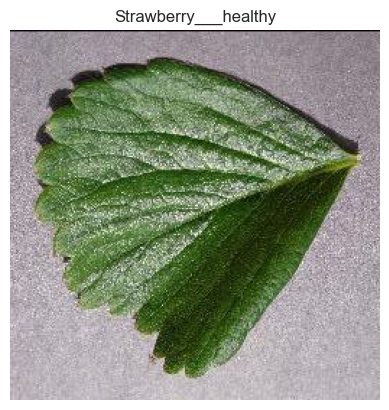

The Number of Images in Grape___Black_rot 1888
(256, 256)


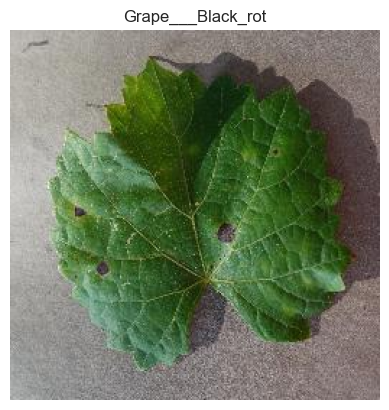

The Number of Images in Potato___Early_blight 1939
(256, 256)


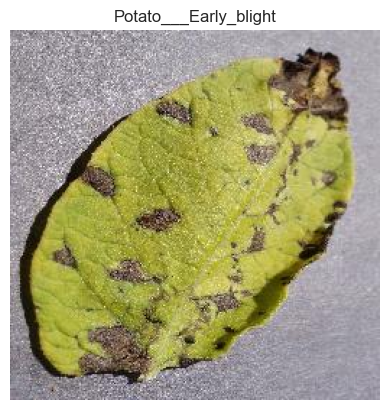

The Number of Images in Blueberry___healthy 1816
(256, 256)


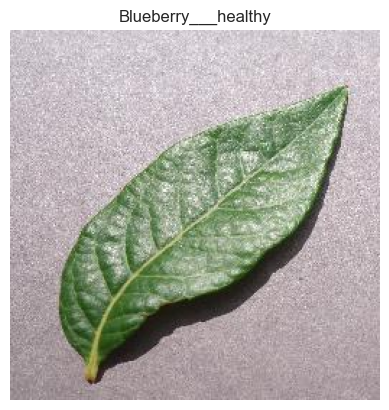

The Number of Images in Corn_(maize)___healthy 1859
(256, 256)


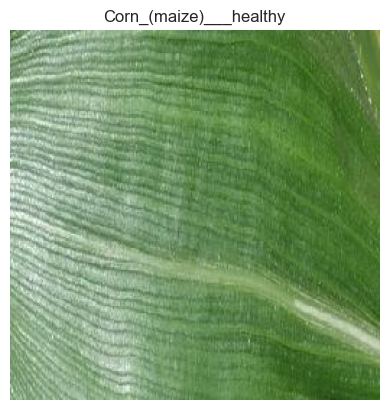

The Number of Images in Tomato___Target_Spot 1827
(256, 256)


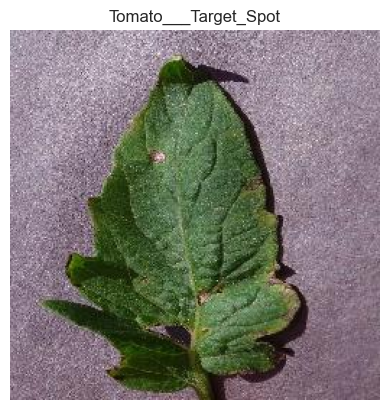

The Number of Images in Peach___healthy 1728
(256, 256)


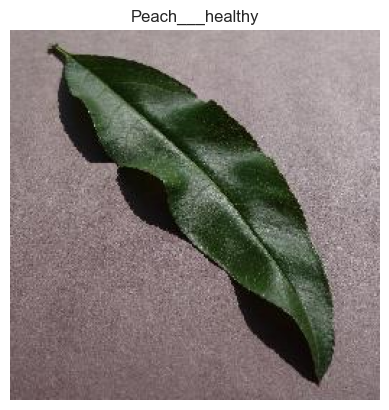

The Number of Images in Potato___Late_blight 1939
(256, 256)


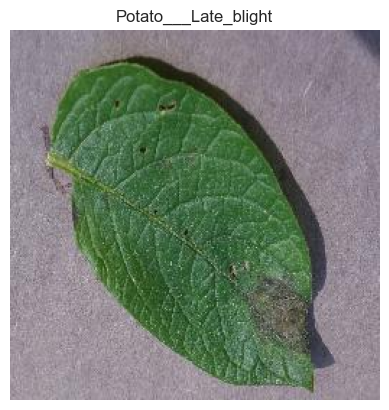

The Number of Images in Tomato___Late_blight 1851
(256, 256)


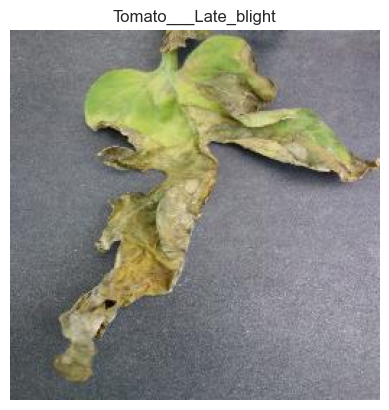

The Number of Images in Tomato___Tomato_mosaic_virus 1790
(256, 256)


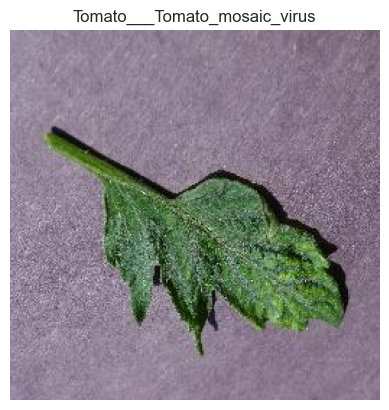

The Number of Images in Pepper,_bell___healthy 1988
(256, 256)


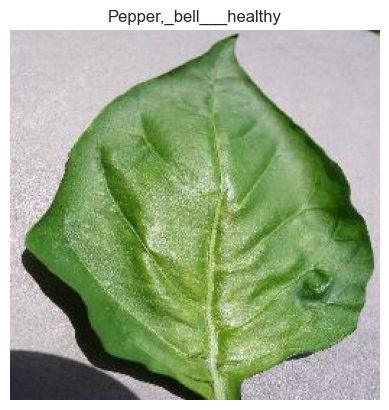

The Number of Images in Orange___Haunglongbing_(Citrus_greening) 2010
(256, 256)


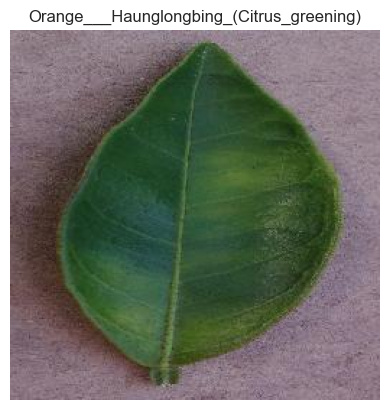

The Number of Images in Tomato___Leaf_Mold 1882
(256, 256)


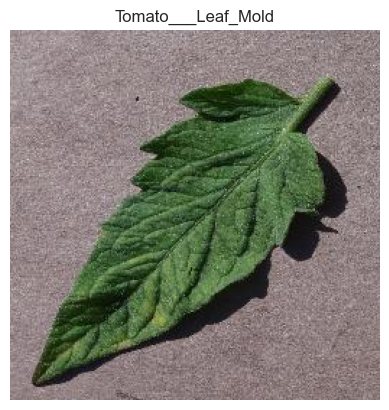

The Number of Images in Grape___Leaf_blight_(Isariopsis_Leaf_Spot) 1722
(256, 256)


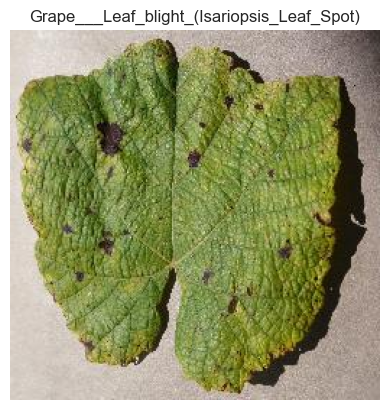

The Number of Images in Cherry_(including_sour)___Powdery_mildew 1683
(256, 256)


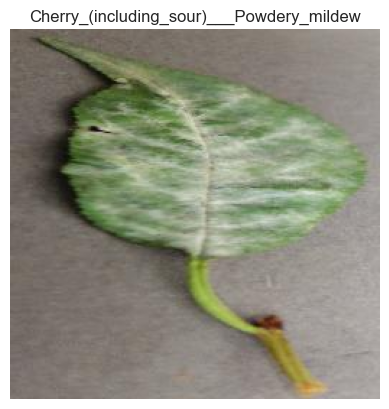

The Number of Images in Apple___Cedar_apple_rust 1760
(256, 256)


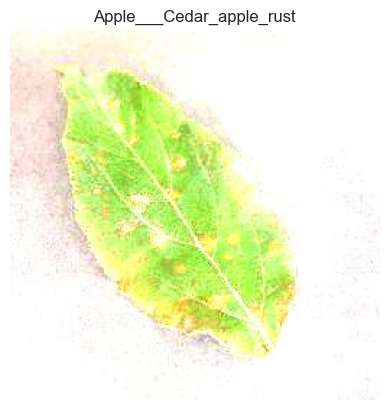

The Number of Images in Tomato___Bacterial_spot 1702
(256, 256)


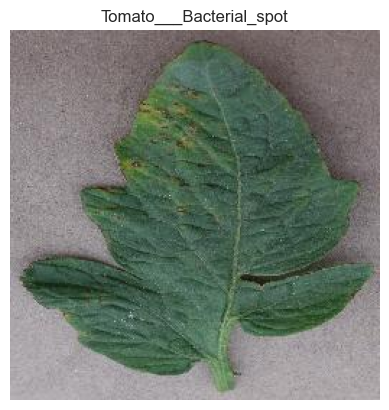

The Number of Images in Grape___healthy 1692
(256, 256)


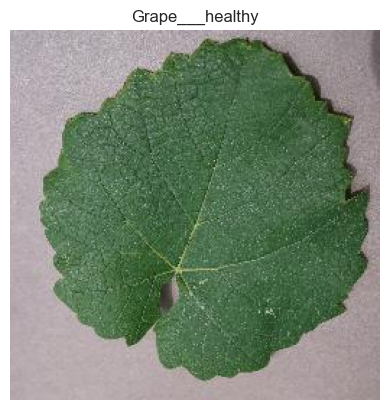

The Number of Images in Tomato___Early_blight 1920
(256, 256)


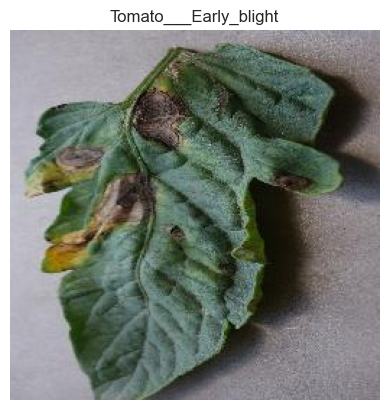

The Number of Images in Corn_(maize)___Common_rust_ 1907
(256, 256)


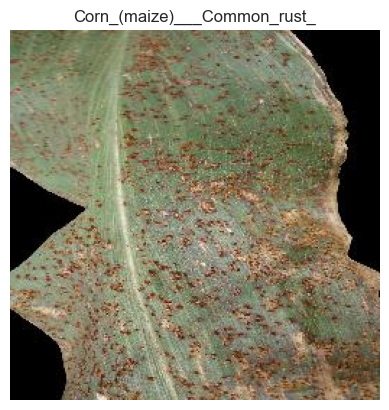

The Number of Images in Grape___Esca_(Black_Measles) 1920
(256, 256)


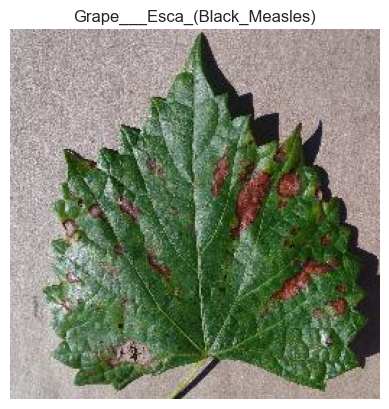

The Number of Images in Raspberry___healthy 1781
(256, 256)


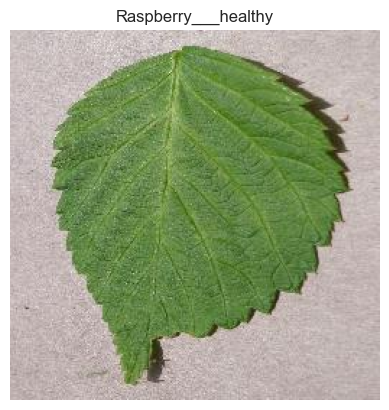

The Number of Images in Tomato___healthy 1926
(256, 256)


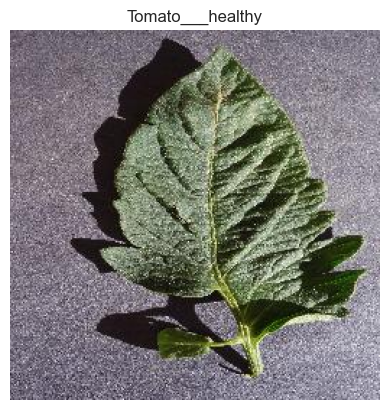

The Number of Images in Cherry_(including_sour)___healthy 1826
(256, 256)


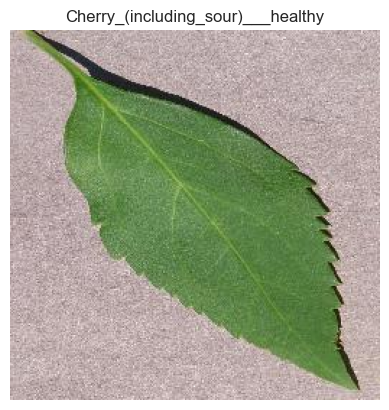

The Number of Images in Tomato___Tomato_Yellow_Leaf_Curl_Virus 1961
(256, 256)


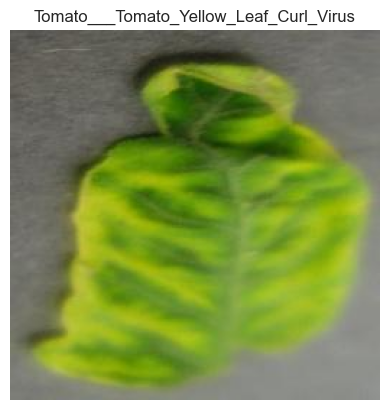

The Number of Images in Apple___Apple_scab 2016
(256, 256)


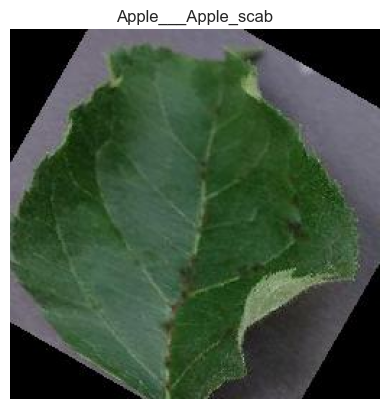

The Number of Images in Corn_(maize)___Northern_Leaf_Blight 1908
(256, 256)


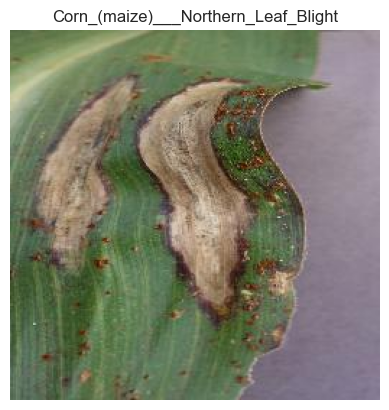

The Number of Images in Tomato___Spider_mites Two-spotted_spider_mite 1741
(256, 256)


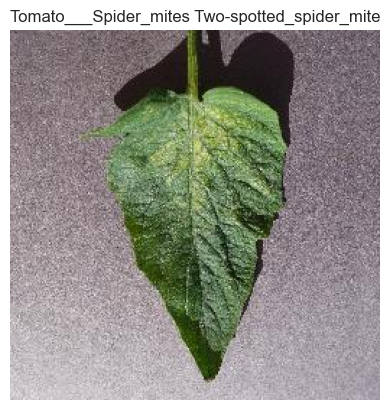

The Number of Images in Peach___Bacterial_spot 1838
(256, 256)


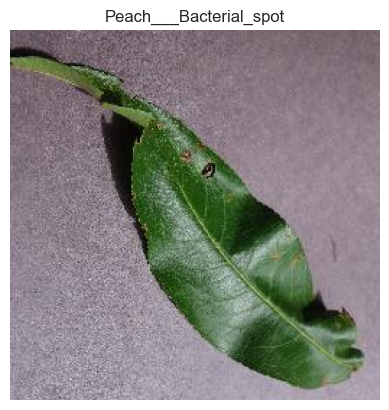

The Number of Images in Pepper,_bell___Bacterial_spot 1913
(256, 256)


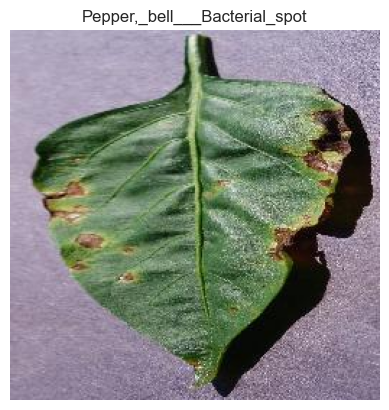

The Number of Images in Tomato___Septoria_leaf_spot 1745
(256, 256)


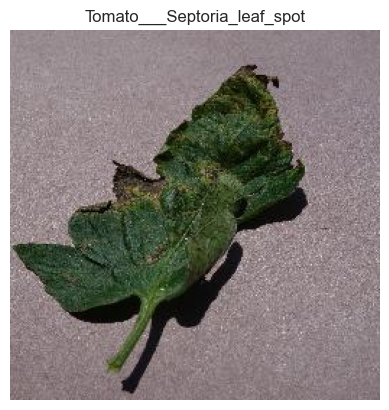

The Number of Images in Squash___Powdery_mildew 1736
(256, 256)


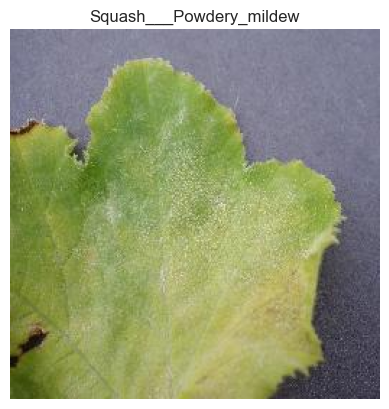

The Number of Images in Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot 1642
(256, 256)


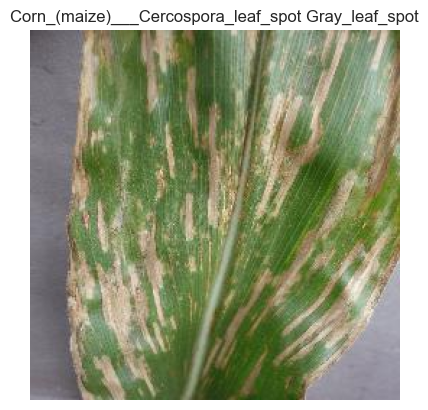

The Number of Images in Apple___Black_rot 1987
(256, 256)


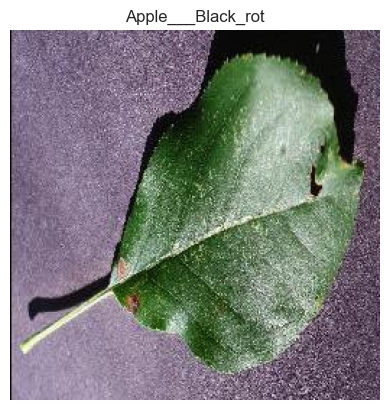

The Number of Images in Apple___healthy 2008
(256, 256)


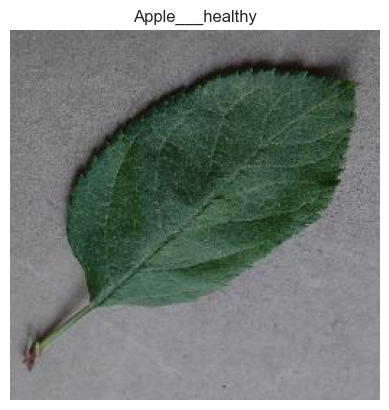

The Number of Images in Strawberry___Leaf_scorch 1774
(256, 256)


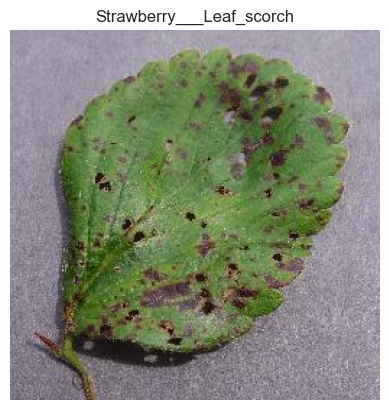

The Number of Images in Potato___healthy 1824
(256, 256)


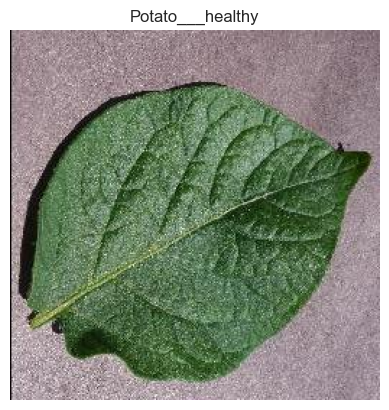

The Number of Images in Soybean___healthy 2022
(256, 256)


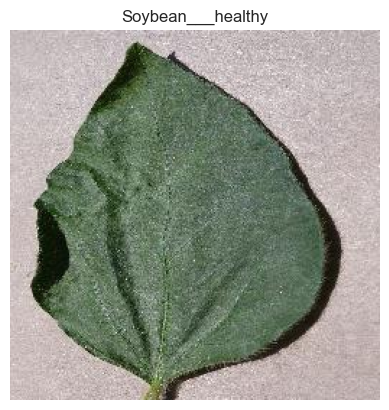

In [67]:
from PIL import Image
#defining the number of images per disease classes to show
num_images_per_class = 1

#loop over each disease class
for disease in Disease_classes:
    #define the directory for the current disease class
    class_dir = os.path.join(train_dir, disease)
    image_files = os.listdir(class_dir)


    #list of all images in current directory
    image_files = os.listdir(class_dir)

    #select a subset of image in this case the first image
    image_subset = image_files[:num_images_per_class]
    
    #loop over each image in the  subset

    for image in image_subset:
        image_path= os.path.join(class_dir, image)

        #open and display image using PIL
        image = Image.open(image_path)
        print( 'The Number of Images in '+disease ,len(image_files))
        plt.imshow(image)
        print(image.size)
        plt.title(disease)
        plt.axis('off')
        plt.show()
    



### comparing numbers of images in different diseaese classes

In [48]:
import pandas as pd

#create an empty dataframe
image_counts = []

for disease in Disease_classes:
    class_dir = os.path.join(train_dir, disease)

    image_files = os.listdir(class_dir)

    num_images = len(image_files)
    

    image_counts.append({'Disease Class':disease,
                                        'Image_count':num_images})
    
    image_count_df = pd.DataFrame(image_counts)

max_class = image_count_df['Image_count'].max()
print(max_class)

min_class = image_count_df['Image_count'].min()
print(min_class)

2022
1642


In [54]:
!pip install seaborn

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 294.9/294.9 kB 4.2 MB/s eta 0:00:00a 0:00:01


/var/folders/yn/jzzqv3s17t5_glr9g2gqxmyh0000gn/T/ipykernel_2936/3873546773.py:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


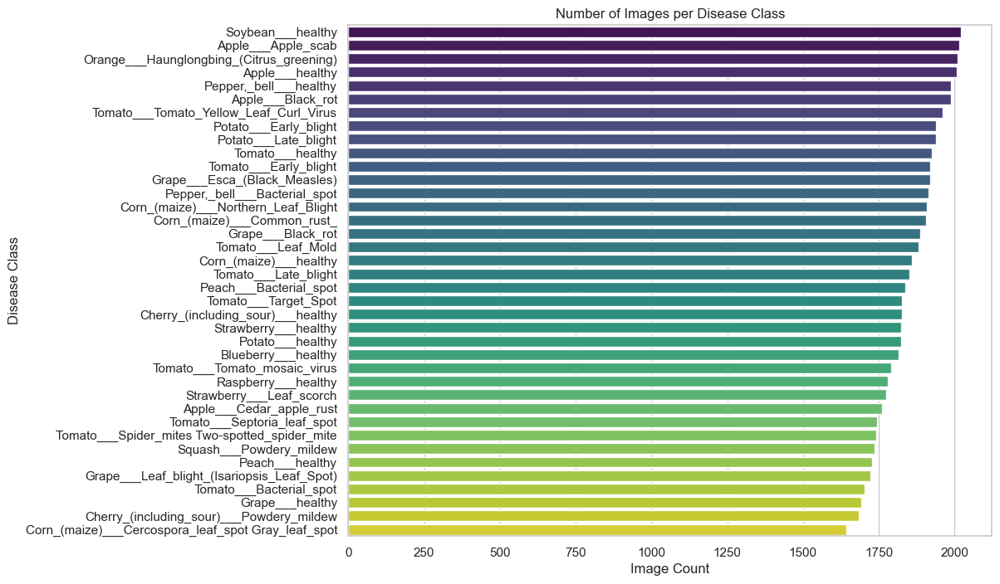

In [60]:
import seaborn as sns
image_count_sorted = image_count_df.sort_values(by='Image_count', ascending=False)


sns.set(style='whitegrid')
plt.figure(figsize=(10,8))
sns.barplot(
    x='Image_count',
    y= 'Disease Class',
    data = image_count_sorted,
    palette='viridis'
)

plt.xlabel('Image Count')
plt.ylabel('Disease Class')
plt.title('Number of Images per Disease Class')

plt.show()


In [78]:
import tensorflow as tf

# Define the path to the directory containing the images
image_size = (256,256)
batch_size = 32

train_dataset = tf.keras.preprocessing.image_dataset_from_directory(
    train_dir,
    labels='inferred',
    label_mode='categorical',
    image_size=image_size,
    batch_size=batch_size,
    shuffle=False
)


print(train_dataset)

Found 70295 files belonging to 38 classes.
<_BatchDataset element_spec=(TensorSpec(shape=(None, 256, 256, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 38), dtype=tf.float32, name=None))>


In [86]:
for images, labels in train_dataset:
    print("Batch of images shape:", images.shape)
    print("Batch of labels shape:", labels.shape)
    image_tensor = images[0]
    print(images[23])
    break  # Print only the first batch for brevity

Batch of images shape: (32, 256, 256, 3)
Batch of labels shape: (32, 38)
tf.Tensor(
[[[  5.   2.  19.]
  [194. 191. 208.]
  [219. 216. 235.]
  ...
  [126. 113. 139.]
  [156. 143. 169.]
  [136. 123. 149.]]

 [[  0.   0.  14.]
  [137. 134. 151.]
  [162. 159. 178.]
  ...
  [169. 156. 182.]
  [169. 156. 182.]
  [145. 132. 158.]]

 [[  3.   0.  17.]
  [115. 112. 129.]
  [148. 145. 164.]
  ...
  [159. 146. 172.]
  [167. 154. 180.]
  [145. 132. 158.]]

 ...

 [[  1.   0.  13.]
  [ 39.  37.  51.]
  [ 45.  43.  57.]
  ...
  [150. 137. 165.]
  [171. 158. 186.]
  [141. 128. 156.]]

 [[  0.   0.  12.]
  [ 37.  35.  49.]
  [ 44.  42.  56.]
  ...
  [158. 145. 173.]
  [153. 140. 168.]
  [171. 158. 186.]]

 [[  0.   0.  12.]
  [ 36.  34.  48.]
  [ 44.  42.  56.]
  ...
  [151. 138. 166.]
  [137. 124. 152.]
  [137. 124. 152.]]], shape=(256, 256, 3), dtype=float32)


In [94]:
images, labels = train_dataset
labels

ValueError: too many values to unpack (expected 2)